<h1><center>Livrable Final</center></h1> 

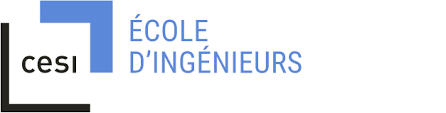

<br>

<h2>Définition du problème</h2>

Pour ce projet, il nous a été demandé de proposer une solution au probléme de tournées de véhicules. Dans notre contexte, une entreprise veut investir dans l optimisation de son service de livraison. Nous allons devoir definir une carte, qui  sera composée de plusieurs villes à parcourir par les livreurs. L'objectif est de parcourir la carte en passant par chaque
villes une seule fois sans possibilité d'y repasser durant la tournée. Le but étant de renvoyer le livreur à son point de
départ, et de minimiser la distance de la tournée ainsi que la durée de livraison.
<br>

<h2>Contraintes choisies</h2>

Parmis les contraintes qui nous ont été proposée, voici celle que nous avons retenu :<br>
La fenêtre de temps de livraison pour chaque objet:
<ul>
    <li>
Interdiction de livrer hors de la fenêtre
    </li>
</ul>

<br>


<h2>La structure des données</h2>

Nous devons, dans un premier temps ecrire notre graphe de façon lisible pour notre programme. Pour cela, nous allons devoir choisir une structure de données.

Dans notre cas, j'ai choisi l'utilisation d'une matrice d'adjacence et une liste d'adjacence.

Nous allons donc voir comme choisir laquelle utiliser pour notre projet.

<h4>Listes d'adjacences</h4>

La liste d'adjacence d'un graphe non orienté, est la liste des voisins de chaque sommet. Celle d'un graphe orienté est typiquement, pour chaque sommet, la liste de nœuds à la tête de chaque arête ayant le sommet comme queue.

C'est une représentation relativement compacte lorsqu'il y a peu d'arêtes (graphe creux), puisque la liste globale contient 2m éléments, où m est le nombre d'arêtes.

Une représentation par liste d'adjacence d'un graphe associe, à chaque sommet du graphe, la collection de ses voisins, comme sommets ou comme arêtes. Il existe de nombreuses variations de ce principe de base, qui diffèrent par des détails dans la mise en œuvre de l'association entre les sommets et ces collections, et de l'implémentation de ces collections elles-mêmes, selon qu'elles comprennent, comme élément de base, les deux sommets des arêtes, ou les arêtes comme objet, ou seulement les sommets voisins, ou encore dans le choix des types d'objets utilisés pour représenter les sommets et la liste de tes.

uisque cette représentation par liste d'adjacence a des limites, essayons d'utiliser une autre structure : une matrice d'adjacence.

<h4>Matrices d'adjacences</h4>


Dans cette structure, on utilise une matrice carrée $m$ de taille $n\times n$ (avec $n$ le nombre de sommets) dans laquelle une arête $a~— b$ est représentée par la valeur $1$ dans l'élément $m_{ab}$. Pour les sommets non reliés entre eux, on met la valeur $0$.

Est-elle meilleure que la liste d'adjacence ?

Elle n'est ni meilleure, ni moins bonne. Certaines opérations sont plus faciles à réaliser sur cette structure, et inversement certaines sont plus faciles à effectuer sur la liste d'adjacence.

Notamment, la matrice est plus efficace pour accéder aux prédécesseurs d'un voisin (c'est aussi rapide qu'accéder à ses successeurs), vérifier l'existence d'une arête, et modifier le graphe.
    
En revanche, construire une liste de voisins d'un sommet est plus lourd, puisqu'il faut parcourir toute la ligne concernée de la matrice, ce qui implique donc un traitement en $n$ opérations ($n$ étant le nombre de sommets).


<h2>Complexity</h2>

The calculation of the complexity of an algorithm makes it possible to measure its performance. There are two types of complexity:
- Spatial complexity: memory usage
- Time complexity: the speed of execution

The objective of an algorithmic complexity calculation is to be able to compare the efficiency of algorithms solving the same problem. This therefore makes it possible to establish which algorithm is the most optimal.

In theoretical computer science, an NP-hard problem is a problem to which we can reduce any problem of the class NP (A decision problem is in NP if it is decided by a non-deterministic Turing machine in polynomial time with respect to the size of the input) by a polynomial reduction (It is a special class of reductions).
If it is also in class NP, it is said to be an NP-complete problem.

![Ceci est un exemple d’image](https://cdn.discordapp.com/attachments/609503978249650176/991030162596429854/unknown.png)


<h3> Complexity in the TSP </h3>
    
Comparison of execution times between different complexities performing one million operations per second depending on the size of the instance.

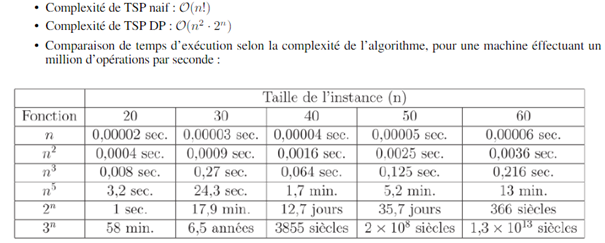

<h2> The different types of algorithms </h2>

<h4>Exact method:</h4>

- Procedure by Separation and Evaluation
- Dynamic programming
- Constraint Programming
- Linear programming

<h4>Approximate Method:</h4>

- Nearest neighbor (NN) 
- Algorithme de Christoﬁdes
- Heuristique K-opt
- Ant colony optimization
- Genetic Algorithm


<h2>Notions on the Genetic Algorithm</h2>

For our resolution of the traveler problem we first focused on a metaheuristic solution with a genetic algorithm.

Given this, there are two important rules to keep in mind:

Each city needs to be visited exactly one time
We must return to the starting city, so our total distance needs to be calculated accordingly
The approach
Let’s start with a few definitions, rephrased in the context of the TSP:
<ul>
    
<li>Gene: a city (represented as (x, y) coordinates)</li>
<li>Individual (aka “chromosome”): a single route satisfying the conditions above</li>
<li>Population: a collection of possible routes (i.e., collection of individuals)</li>
<li>Parents: two routes that are combined to create a new route</li>
<li>Mating pool: a collection of parents that are used to create our next population (thus creating the next generation of routes)</li>
<li>Fitness: a function that tells us how good each route is (in our case, how short the distance is)</li>
<li>Mutation: a way to introduce variation in our population by randomly swapping two cities in a route</li>
<li>Elitism: a way to carry the best individuals into the next generation</li>
</ul>

The following code thus describes the operation of the genetic algorithm.
(some functions are not necessary but useful for display thanks to the plot library)

<h4>Etape clés de l’algorithme génétique</h4>

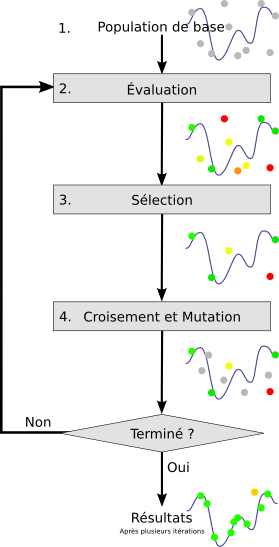


<h4>Select the mating pool </h4>

There are a few options for how to select the parents that will be used to create the next generation. The most common approaches are either fitness proportionate selection (aka “roulette wheel selection”) or tournament selection:

- Fitness proportionate selection (the version implemented below): The fitness of each individual relative to the population is used to assign a probability of selection. Think of this as the fitness-weighted probability of being selected.
- Tournament selection: A set number of individuals are randomly selected from the population and the one with the highest fitness in the group is chosen as the first parent. This is repeated to chose the second parent.



In [1]:
import numpy as np, random, operator, pandas as pd, matplotlib.pyplot as plt
import os
import imageio.v2 as imageio
from IPython.display import Image
import csv
from ast import literal_eval
from pprint import pprint
import math 
import time




plt.rcParams['figure.figsize'] = [10, 10]

class City:  # Classe des villes qui contient les coordonées x et y de la ville et une fonction distance pour permettre de calculer la distance entre deux villes
    def __init__(self, x, y): #init des coord
        self.x = x
        self.y = y
    
    def distance(self, city): #méthode permettant de calculer la distance entre deux villes via théo de pytagore
        xDis = abs(self.x - city.x)
        yDis = abs(self.y - city.y)
        distance = np.sqrt((xDis ** 2) + (yDis ** 2))
        return distance
    
    def __repr__(self): # fonction d'affichage (osef)
        return "(" + str(self.x) + "," + str(self.y) + ")"
    
    
    
# apparté (Route = chemin possible pour la résolution du TSP ) dans notre cas l'ensemble des routes représente notre population qu'on va devoir "sélectionner génetiquement"


class Fitness: # Classe qui va nous permettre de voir à quel point une route est 'bonne' et ainsi de faire la séléction génétique
    def __init__(self, route): #Initialisation de la route donc avec sa distance et son "score de validité" (>fitness)
        self.route = route #Une route est réprésenté par une liste de villes 
        self.distance = 0
        self.fitness= 0.0
    
    def routeDistance(self):  # Cette fonction va nous permettre de calculer toutes les distances entre chaques villes composant la route pour nous donner donc la distance total
        if self.distance ==0: # donc si la distance est nul on init pathDistance à 0
            pathDistance = 0
            for i in range(0, len(self.route)): # ( =pour tout les élément dans la route ... )       #len = taille tableau
                fromCity = self.route[i] #fromCity = élement de la route du for
                toCity = None #(pour géré dernier élement voir suite)
                if i + 1 < len(self.route): # si il y a un élement après l'élément sélectionné 
                    toCity = self.route[i + 1] # alors on le sélectionne en tant que toCity
                else: # sinon on le met le référent toCity sur la premiere ville car graphe hamiltoniens (nous devons revenir au début)
                    toCity = self.route[0]
                pathDistance += fromCity.distance(toCity) # pathDistance va etre incrémenté de la distance entre chaque villes composant la route
            self.distance = pathDistance # et à la fin on attibut pathDistance(var local) à l'attribut distance de la classe 
        return self.distance
    
    def routeFitness(self): # fonction qui va nous renvoyé "le score de validité" qui est inversement proportionnel à la distance( plus distance est petite plus le score est élévé)
        if self.fitness == 0:
            self.fitness = 1 / float(self.routeDistance())
        return self.fitness
    
def createRoute(cityList): # fonction qui va permettre de creer une route aléatoire (pour rappel liste de city), => liste de routes remplies aléatoirement selon les villes disponibles 
    route = random.sample(cityList, len(cityList))
    return route

def initialPopulation(popSize, cityList): # fonction qui va permettre de creer la population initial selon popSize(choisie par utilisateur) et les villes disponibles (créer aléatoirement au début du programme)
    population = [] #La population est donc une liste composé de route(qui sont faite aléatoirement selon les villes disponibles) au nombre de popSize

    for i in range(0, popSize):
        population.append(createRoute(cityList))
    return population

def rankRoutes(population): #fonction qui va permettre de lister les routes selons leurs id et leurs score fitness afin de determiner les meilleurs routes
    fitnessResults = {}
    for i in range(0,len(population)): 
        fitnessResults[i] =  Fitness(population[i]).routeFitness()  
    return sorted(fitnessResults.items(), key = operator.itemgetter(1), reverse = True) # on retourne donc une liste trié par meilleur route


#fonction de séléction de la prochaine gén basé sur "Fitness proportionate selection" et l'élitisme
# grâce à la liste des résultat de fitness 
def selection(popRanked, eliteSize): 
    selectionResults = []
    
    #partie Fitness proportionate selection
    #biblio panda.Dataframe = permet de faire un tableau genre excel
    #ça va nous permettre de calculer la somme de toutes les fitness des routes et un pourcentage réprésentant des "poids" relatif au route
    df = pd.DataFrame(np.array(popRanked), columns=["Index","Fitness"])   # Genre là on fait un tableau des routes classé selon les meilleurs avec comme colonne l'index des routes(l'id) et leurs "score de validité"
    df['cum_sum'] = df.Fitness.cumsum()
    df['cum_perc'] = 100*df.cum_sum/df.Fitness.sum()
    
    
    # Partie permettant l'élitisme
    #l'élitisme permet au meilleurs routes de la population d'acceder directement à la prochaine génération pour s'assurer que les meilleurs résultat persiste 
    for i in range(0, eliteSize): # selon la var eliteSize rentré par utilisateur on va sélectionner les routes ayant les meilleurs résultats
        selectionResults.append(popRanked[i][0])
        
    #suite de la partie Fitness proportionate selection, 
    #we compare a randomly drawn number to these weights to select our mating pool. 
    #On compare a nombre tiré au hasard avec les poids de 
    for i in range(0, len(popRanked) - eliteSize):
        pick = 100*random.random() # nombre tiré au hasard
        for i in range(0, len(popRanked)):
            if pick <= df.iat[i,3]: # On compare le nombre aléatoire à la case de notre table panda au coordoné [i,3]
                selectionResults.append(popRanked[i][0]) # si le nombre aléatoire est inférieur ou égal alors on l'add à next gen
                break
    return selectionResults




#fonction qui va appeler la fonction de sélection(voir plus haut) pour renvoyer une liste des meilleurs routes (route qui vont devenir les parents de la prochaine génération)
def matingPool(population, selectionResults): 
    matingpool = []
    for i in range(0, len(selectionResults)):
        index = selectionResults[i]
        matingpool.append(population[index])
    return matingpool

#On va créer une nouvelle route grâce à deux parents qui apparaitra dans la prochaine génération (un peu flou le fonctionnement)
def breed(parent1, parent2): 
    child = []
    childP1 = []
    childP2 = []
    
    geneA = int(random.random() * len(parent1))
    geneB = int(random.random() * len(parent1))
    
    startGene = min(geneA, geneB)
    endGene = max(geneA, geneB)

    for i in range(startGene, endGene):
        childP1.append(parent1[i])
        
    childP2 = [item for item in parent2 if item not in childP1]

    child = childP1 + childP2
    return child

#fonction qui fait le breed pour la prochaine gén
def breedPopulation(matingpool, eliteSize): 
    children = []
    length = len(matingpool) - eliteSize
    pool = random.sample(matingpool, len(matingpool))

    for i in range(0,eliteSize):
        children.append(matingpool[i]) #les routes élites (voir elistme function selection) vont etre directement utilisé dans la prochaine génération 
    
    for i in range(0, length): # les routes issues du Fitness proportionate selection sont quand à elle utilisé comme "parent" pour créer une nouvelle route qui sera utilisé dans la prochaine génération
        child = breed(pool[i], pool[len(matingpool)-i-1])
        children.append(child)
    return children


#Mutation serves an important function in GA, as it helps to avoid local convergence 
#by introducing novel routes that will allow us to explore other parts of the solution space. 
# with specified low probability, two cities will swap places in our route.

# Dans cette fonction, avec une probabilité basse spécifié, on va échanger la place de deux ville 
# dans l'optique d'éviter une convergence local et explorer d'autre partie de solution possible
def mutate(individual, mutationRate):
    for swapped in range(len(individual)):
        if(random.random() < mutationRate):
            swapWith = int(random.random() * len(individual))
            
            city1 = individual[swapped]
            city2 = individual[swapWith]
            
            individual[swapped] = city2
            individual[swapWith] = city1
    return individual


#Fonction pour étendre la mutation à toute la population 
def mutatePopulation(population, mutationRate):
    mutatedPop = []
    
    for ind in range(0, len(population)):
        mutatedInd = mutate(population[ind], mutationRate)
        mutatedPop.append(mutatedInd)
    return mutatedPop



#Fonction qui va créer la nouvelle génération en se servant des fonctions décrite plus haute
#En premier lieu, on établit le rank des meilleurs routes dans génération actuelle, on fait la sélection suivit d'une mating pool
#et finalement on créer la nouvelle génération grâce à la fonction breedPopulation qu'on applique à toute la population via la fonction mutatePopulation

def nextGeneration(currentGen, eliteSize, mutationRate):
    popRanked = rankRoutes(currentGen)
    selectionResults = selection(popRanked, eliteSize)
    matingpool = matingPool(currentGen, selectionResults)
    children = breedPopulation(matingpool, eliteSize)
    nextGeneration = mutatePopulation(children, mutationRate)
    #do function to get img graph of best fitness
    return nextGeneration

#fonction main qui prend en compte tout les parametres mais pas utilisé on prend la version plot qui donnes des graphiques
def geneticAlgorithm(population, popSize, eliteSize, mutationRate, generations):
    pop = initialPopulation(popSize, population)
    #print("Initial distance: " + str(1 / rankRoutes(pop)[0][1]))
    
    
    for i in range(0, generations):
        pop = nextGeneration(pop, eliteSize, mutationRate)
    
    #print("Final distance: " + str(1 / rankRoutes(pop)[0][1]))
    bestRouteIndex = rankRoutes(pop)[0][0]
    bestRoute = pop[bestRouteIndex]
    return bestRoute,  (1 / rankRoutes(pop)[0][1])




def plotDrawBestRoute(route) : #fonction d'affichage plot
    coord = [ ]
    xo = [ ]
    yo = [ ]
    for city in route :
        xo.append(city.x)
        yo.append(city.y)
    xo.append(route[0].x) #graphe hamiltonien donc pour retourner au début (premiere ville)
    yo.append(route[0].y)
    coord = [xo, yo]
    return coord



#lancement de l'algo no plot
#geneticAlgorithm(population=cityList, popSize=100, eliteSize=20, mutationRate=0.01, generations=500) 


#fonction d'affichage plot
def geneticAlgorithmPlot(population, popSize, eliteSize, mutationRate, generations):
    
    timeAlg = time.time()
    pop = initialPopulation(popSize, population)
    print("Number of cities : " + str(len(cityList)))
    print("Number of generation : " + str(generations))
    print("Number of elites : " + str(eliteSize))
    print("Mutation rate : " + str(mutationRate))
    print("Initial distance: " + str(1 / rankRoutes(pop)[0][1]))
    progress = []
    filenames = []
    bestRouteCoord = []
    
    x = 0   # fornamefile
    
    timeAlg = time.time() - timeAlg
    
    progress.append(1 / rankRoutes(pop)[0][1])
    
    for i in range(0, generations):
        pop = nextGeneration(pop, eliteSize, mutationRate)
        progress.append(1 / rankRoutes(pop)[0][1])       
        
        timeAlg = timeAlg + (time.time() - timeAlg)
        timePlot = time.time()
        #-------- part plot
        if i == 0 :
            bestRouteFirstGen = pop[rankRoutes(pop)[0][0]] 
            coordFirstGen = plotDrawBestRoute(bestRouteFirstGen) #best first gen route after compute
            bestRouteIdGen = i;
            bestRouteDist = rankRoutes(pop)[0][1];
            bestRouteCoord = coordFirstGen.copy()
            
            lastBestDist = 1 / rankRoutes(pop)[0][1]
            
        elif  rankRoutes(pop)[0][1] > bestRouteDist : # si la distance de la gén est plus courte que la meilleur plus courte alors on la remplace par celle ci
            bestRouteIdGen = i;
            bestRouteDist = rankRoutes(pop)[0][1];
            bestRouteCoord = plotDrawBestRoute(pop[rankRoutes(pop)[0][0]])
            
            
        #print(rankRoutes(pop)[0][1])
        #print(bestRouteDist)
        #print()   
        
        
        if i % 1 == 0 :
            # plot the line chart
            bestRouteFirstGen = pop[rankRoutes(pop)[0][0]] 
            coordBestGen = plotDrawBestRoute(bestRouteFirstGen) #best first gen route after compute
            fig = plt.figure(figsize=(14, 6))
            fig.suptitle("Best route for generation {}".format(x))
            plt.plot(coordBestGen[0], coordBestGen[1])
            for city in cityList :
                plt.plot(city.x, city.y, 'ro')
        
            # create file name and append it to a list
            filename = f'{x}.png'
            filenames.append(filename)

            # save frame
            plt.savefig(filename)
            plt.close()
            x = x + 1
        
        
        timePlot = time.time() - timePlot
        timeAlg = timeAlg + (timePlot - timeAlg)

        
        
        
    #print("Final distance: " + str(1 / rankRoutes(pop)[0][1]))
    print("Best distance: " + str(1 / bestRouteDist))
    #print("Time compute Algo: " + str(math.trunc(timeAlg*1000) / 1000) + "s")
    
    
    #bestRouteIndex = rankRoutes(pop)[0][0]
    #bestRoute = pop[bestRouteIndex] # keep best route last gen
    
    fig = plt.figure(figsize=(14, 6))
    fig.suptitle('Graphe Initial')
    #print(str(len(cityList)) + "blabla")
    for i in range(0,len(cityList)): 
        plt.plot(cityList[i].x,cityList[i].y,"ro",)
    plt.show()
    
    # build gif
    with imageio.get_writer('mygif.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
        
    with open('mygif.gif','rb') as file: #display gif output
        display(Image(file.read()))
    
    
    #Remove files
    for filename in set(filenames):
        os.remove(filename)
    bestRouteCoordEachGen = progress.copy()
        
    #sort bestRouteCoordEachGen from progress 
    ir = 0
    while ir < len(bestRouteCoordEachGen) :
        jr = ir + 1;
        while jr < len(bestRouteCoordEachGen) :
            if bestRouteCoordEachGen[ir] <= bestRouteCoordEachGen[jr] : 
                bestRouteCoordEachGen[jr] = bestRouteCoordEachGen[ir]
                break
            jr = jr + 1
        ir = ir + 1;
        
                
    
    
    
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle("Comparaison best route first generation and best route all generation (= {})".format(bestRouteIdGen) )
    ax1.plot(coordFirstGen[0], coordFirstGen[1])
    for city in cityList :
        ax1.plot(city.x, city.y, 'ro')
        ax2.plot(city.x, city.y, 'ro')

    ax2.plot(bestRouteCoord[0], bestRouteCoord[1])
    
    plt.figure(figsize=(14, 6))
    plt.plot(progress)
    plt.plot(bestRouteCoordEachGen)
    plt.ylabel('Distance')
    plt.xlabel('Generation')
    plt.show()
    
    #return bestRoute
    
#---------------------------------------  
cityList = [] 
nbVilleMax = 0
#création liste aléatoire
def generationCityRandom(nbVilleMax, xmax, ymax):    
    for i in range(0,nbVilleMax):
        cityList.append(City(x=int(random.random() * xmax), y=int(random.random() * ymax))) # get data random des villes (x,y)   

def generationCityByCsv(filePath):    
    rows = []
    with open(filePath, 'r') as file:
        csvreader = csv.reader(file)
        for row in csvreader:
            rows.append(row)      
    for i in range(0,len(rows)):
        cityList.append(City(x= math.trunc(int(rows[i][0]) / 1) , y= math.trunc(int(rows[i][1]) / 1  ) )) # get data random des villes (x,y)
    nbVilleMax = len(rows)

**Algorithm test with random city data**

Number of cities : 20
Number of generation : 100
Number of elites : 20
Mutation rate : 0.01
Initial distance: 8692.355196680075
Best distance: 4186.822559972508


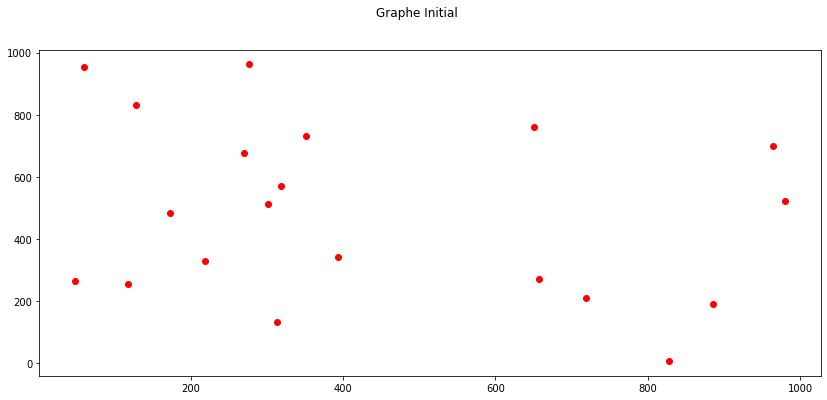

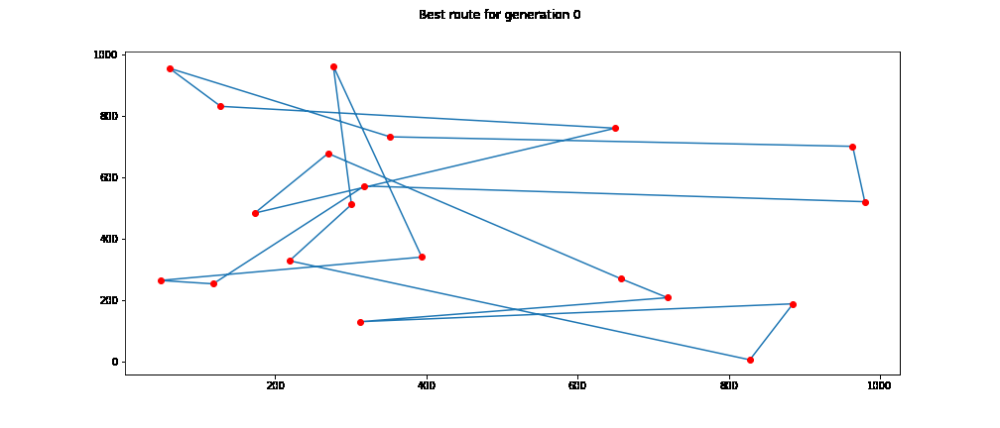

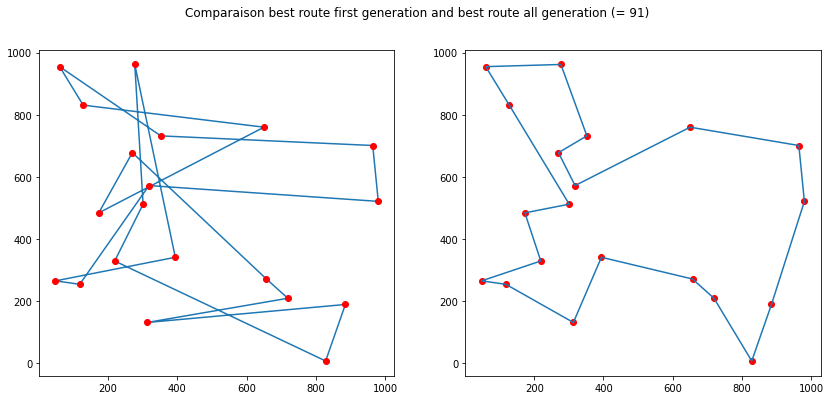

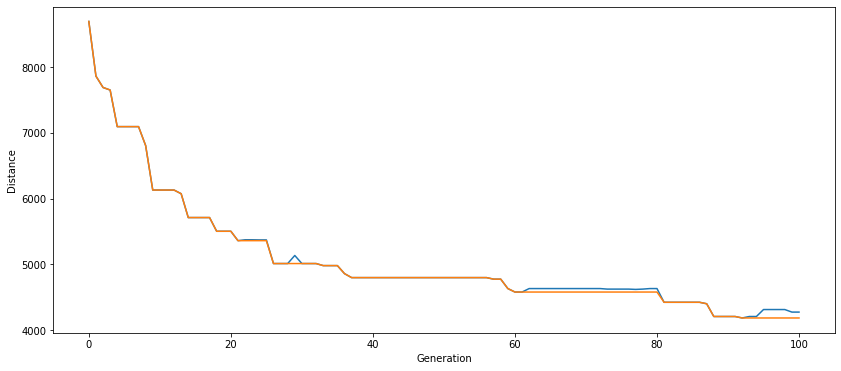

time:  20.453125 s


In [2]:
start = time.process_time()
cityList = [] 
generationCityRandom(nbVilleMax = 20, xmax = 1000, ymax = 1000)
geneticAlgorithmPlot(population=cityList, popSize=100, eliteSize=20, mutationRate=0.01, generations=100)

stop = time.process_time()
print("time: ", stop-start, 's')

**Algorithm test with usa city.**

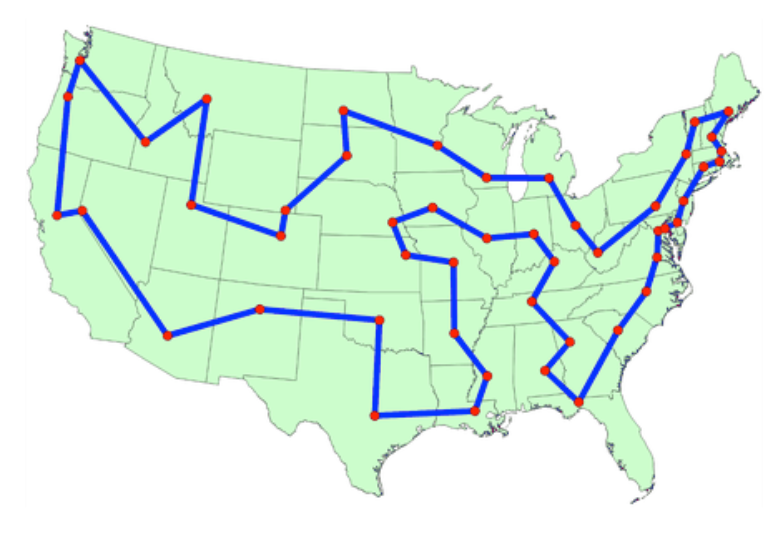
We have a dataset representing 48 cities in the United States and we are testing our genetic algorithm on it.

Number of cities : 20
Number of generation : 500
Number of elites : 20
Mutation rate : 0.01
Initial distance: 50583.028570889255
Best distance: 22960.870727544876


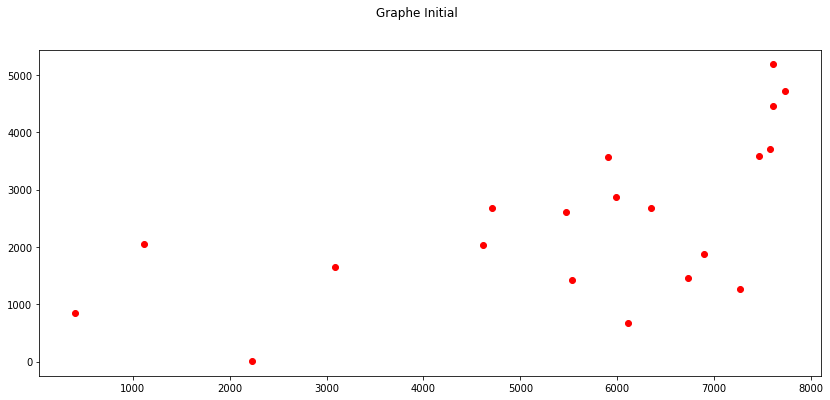

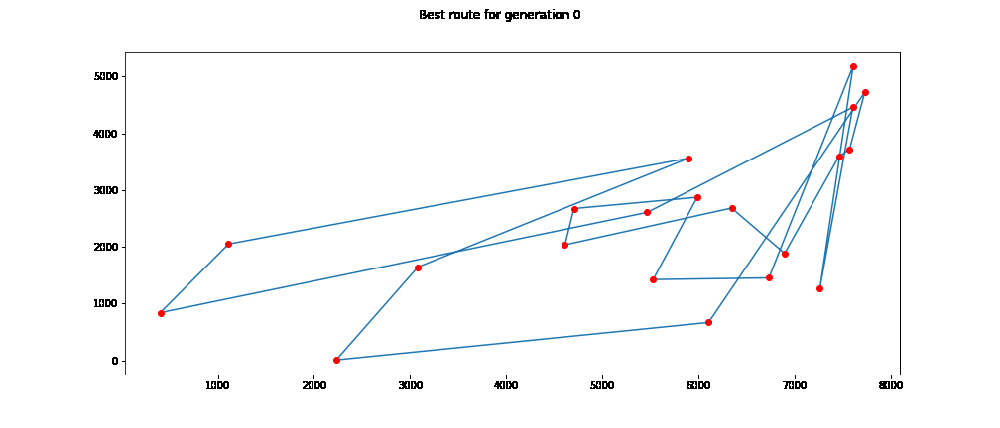

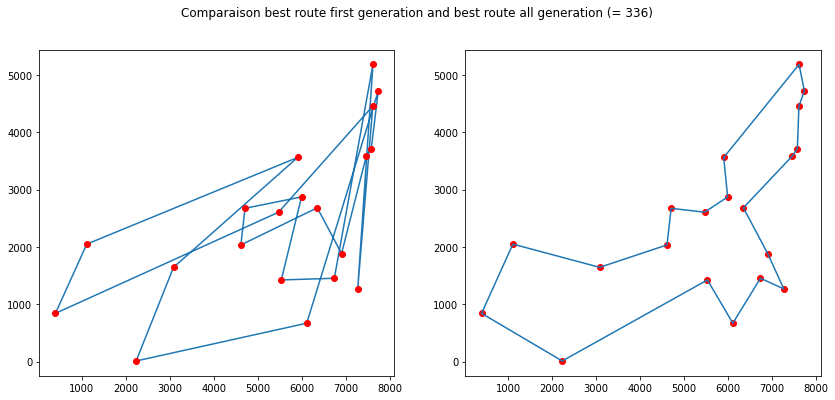

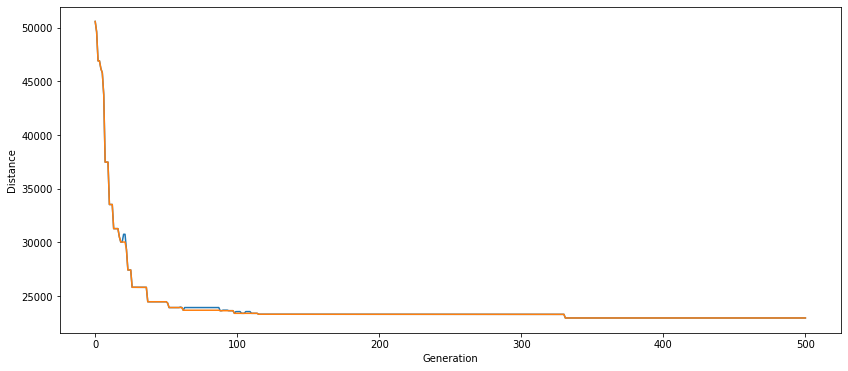

time:  103.046875 s


In [3]:
start = time.process_time()



cityList = [] 
generationCityByCsv(filePath = "coord_usa.csv")
geneticAlgorithmPlot(population=cityList, popSize=100, eliteSize=20, mutationRate=0.01, generations=500)

stop = time.process_time()

print("time: ", stop-start, 's')



Multi-Start exemple with USA Data : 

We can use the multi start on our genetic algorithm, this consists of restarting the algorithm several times by modifying its parameter at each execution in order to see the impact of this one in solving the problem. We are testing below the impact of the "elite" parameter in the algorithm but we can easily modify it to test the others. The results of the multistart are directly in the presentation of the project

time:  35.59375 s


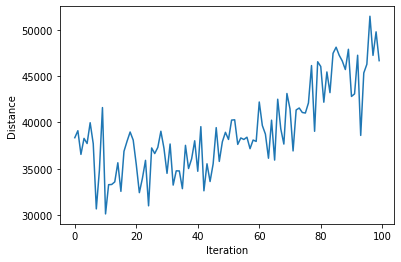

In [4]:
#multistart to test impact of generation parameter
#you can easily test an other variable.

start = time.process_time()

cityList = [] 
generationCityByCsv(filePath = "coord_usa.csv")

elite = 1
AllDist = []
for i in range(0,100):
    best, dist = geneticAlgorithm(population=cityList, popSize=100, eliteSize=elite, mutationRate=0.01, generations=10)
    AllDist.append(dist)
    elite = elite + 1
    #print("it:" + str(i) + " ", end = ' ')
    
stop = time.process_time()
print("time: ", stop-start, 's')

plt.plot(AllDist)
plt.ylabel('Distance')
plt.xlabel('Iteration')
plt.show() 

<h2> Algorithm by linear programming: Simplex </h2>

- Step 1 : Convert 
	The linear program must be converted into an equivalent program with the constraints which become equations
Examples : 

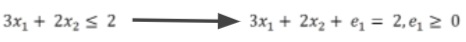

<h4> Simplex Fonctionnement </h4>

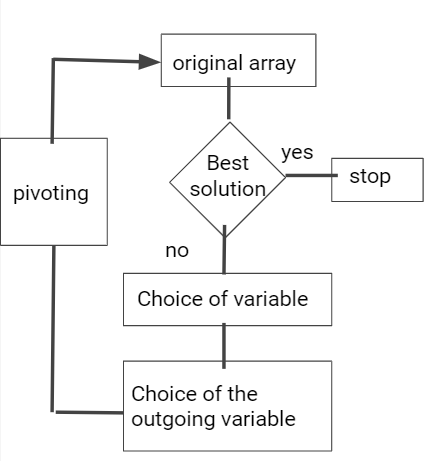


<h2>Simplex Algorithm</h2>


Here is now the resolution of the TSP using an optimal algorithm. For this we used linear programming with the simplex method

In [5]:
import numpy as np
import pandas as pd
from ortools.linear_solver import pywraplp


def solve(distances: np.ndarray):
    """
    :param distances: la matrice avec toutes les distances
    :return:  solution X, model, status
    """
    # on vérifie que la matrice reçue a bien 2 dimensions et après que
    # ses 2 dimensions contiennent le même nombre de distances, car on
    # travaille avec une matrice carrée
    if distances.ndim != 2 and distances.shape[0] != distances.shape[1]:
        raise ValueError("Invalid dima dimensions detected. Square matrix expected.")

    # on détermine le nombre de villes et on cree des variables qui vont servir à itérer dessus
    nombre_de_villes = distances.shape[0]
    index_villes = range(nombre_de_villes)
    index_villes_sauf_premiere = range(1, nombre_de_villes)

    # on cree le modele en mode scip
    model = pywraplp.Solver.CreateSolver('SCIP')
    model.EnableOutput()

    # on génère les variables de decisions sous forme de booleen pour savoir si on passer par cette ville ou pas
    x = {}
    for i in index_villes:
        for j in index_villes:
            x[(i, j)] = model.BoolVar(f"x_i{i}j{j}")

    # on initialise les variables de decision
    u = {i: model.IntVar(0, nombre_de_villes, f"u_i{i}") for i in index_villes}

    # contrainte : on veut un seul successeur
    for i in index_villes:
        model.Add(sum(x[(i, j)] for j in index_villes) == 1)

    # contrainte : on veut un seul prédécesseur
    for j in index_villes:
        model.Add(sum(x[(i, j)] for i in index_villes) == 1)

    # ici on vérifie que l'on fait bien une seule fois le tour
    # contrainte : on commence par la premiere ville
    model.Add(u[0] == 1)

    # on crée un chemin avec toutes les villes, (donc en ne partant pas de la première sinon ça fait doublon et on
    # ne veut pas)
    for i in index_villes_sauf_premiere:
        model.Add(u[i] >= 2)
        model.Add(u[i] <= nombre_de_villes)

    for i in index_villes_sauf_premiere:
        for j in index_villes_sauf_premiere:
            model.Add(u[i] - u[j] + 1 <= (nombre_de_villes - 1) * (1 - x[(i, j)]))

    # on veut que la distance soir la plus petite possible
    model.Minimize(sum(x[(i, j)] * distances[(i, j)] for i in index_villes for j in index_villes))

    status = model.Solve()

    return u, model, status


def print_solution(u, cities):
    """
    :param u: tous les nœuds
    :param cities: le tableau qu'on a récupéré de toutes les villes
    :return: None
    """
    indexList = []
    num_nodes = len(u)
    all_nodes = range(num_nodes)
    solution = {int(u[i].solution_value()): i for i in all_nodes}
    solution = sorted(solution.items())
    print("\nvilles dans l'ordre : ")
    for i in solution:
        print(f"{cities[i[1]]}->", end="")
        indexList.append(cities[i[1]])
    print(cities[solution[0][1]])
    return indexList


def main(city_origin_name, filename):
    # Load dataset and drop useless/empty rows
    df = pd.read_excel(filename, "sheet1")
    df = df.dropna(how="all")

    name_cities = np.array(df.head(1))  # Get cities name
    name_cities = np.array(name_cities[0])  # Reshape array
    name_cities = np.delete(name_cities, 0, axis=0)  # Drop nan value

    # Convert to numpy array
    dima = np.array(df)

    # Get index of the city you want to start
    city_index = -1
    for i in range(len(dima)):
        if dima[i][0] == city_origin_name:
            city_index = i
    if city_index == -1:
        print("Error city not found")
        exit(1)

    # Delete cities' name
    dima = np.delete(dima, 0, axis=1)
    dima = np.delete(dima, 0, axis=0)
    city_index -= 1

    # Swap city origin tsp to position row 0 of array
    dima[[0, city_index]] = dima[[city_index, 0]]  # Distance array
    name_cities[[0, city_index]] = name_cities[[city_index, 0]]  # Cities' name array

    #print(dima)
    
    # now solve problem
    u, model, status = solve(dima)

    # check problem response
    if status == pywraplp.Solver.OPTIMAL:
        print(f'Objective value ={str(model.Objective().Value())}')
        indexList = print_solution(u, name_cities)
    elif status == pywraplp.Solver.INFEASIBLE:
        print("le probleme n'est pas solvable")
    else:
        print(f"le probleme n'a pas pu être resolu, le probleme est : {status}")
    

def getMatrixFromCoord(cityList) : 
    matrix = []
    for i in range(0,len(cityList)):
        citySource = cityList[i]
        row = []
        for j in range(0,len(cityList)): 
            cityCible = cityList[j]
            row.append(int(citySource.distance(cityCible)))
        matrix.append(row)
    dimaNp = np.array(matrix)
    return(dimaNp)


def getNameData(data) : 
    name = []
    for i in range(0,len(data)):
        name.append(i)
    nameNp = np.array(name)
    return nameNp
    
def plotDrawBestRouteSimplex(indexList) : #fonction d'affichage plot
    coord = [ ]
    xo = [ ]
    yo = [ ]
    
    for i in indexList :
        xo.append(cityList[i].x)
        yo.append(cityList[i].y)
    xo.append(cityList[0].x) #graphe hamiltonien donc pour retourner au début (premiere ville)
    yo.append(cityList[0].y)
    coord = [xo, yo]
    return coord

            
def ResolveFromCityList(dima):
    timeAlg = time.time()
    
    name = []
    for i in range(0,len(dima)):
        name.append(i)
    name_cities = np.array(name)
    
    
    u, model, status = solve(dima)

    # check problem response
    if status == pywraplp.Solver.OPTIMAL:
        print(f'Objective value ={str(model.Objective().Value())}')
        indexList = print_solution(u, name_cities)
    elif status == pywraplp.Solver.INFEASIBLE:
        print("le probleme n'est pas solvable")
    else:
        print(f"le probleme n'a pas pu être resolu, le probleme est : {status}")
        
    timeAlg = time.time() - timeAlg
    print("time=" + str(timeAlg) + "sec")
    
        
    bestRouteCoord = plotDrawBestRouteSimplex(indexList)
    fig = plt.figure(figsize=(14, 6))
    plt.plot(bestRouteCoord[0], bestRouteCoord[1])
    for city in cityList :
        plt.plot(city.x, city.y, 'ro')
    plt.show()
    
        
        


#if __name__ == '__main__':
#    main("M.C.G.", "data.xlsx")
    


Objective value =22950.0

villes dans l'ordre : 
0->15->2->1->3->9->4->13->12->10->11->19->16->18->5->6->17->14->8->7->0
time=34.66974067687988sec


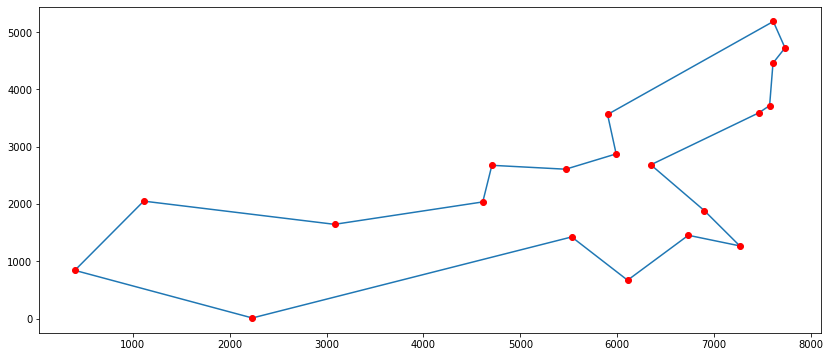

In [6]:
cityList = [] 
generationCityByCsv(filePath = "coord_usa.csv")

data = getMatrixFromCoord(cityList)
ResolveFromCityList(data)

<h2> Algorithm Ant Colonies</h2>


<br>

<h2>Etape n°1: Initialiser l'instance</h2>
<br>
L'instance de cette partie de l'implémentation de l'algorithme est de taille réduite. Par instance il est sous-entendu qu'on parle d'un graphe complet connexe représenté par une matrice carrée dont chaque entrée symbolise nos villes et les valeurs le temps de parcours d'une route.


In [7]:
import numpy as np
from numpy import inf
import random as rd
import warnings
import csv
import sys
import ast
import os
import re

#matrixes: distance and delivery schedule
def readFile(name):
    res = np.loadtxt(name, ndmin=2, dtype=np.int32)
    return res

#returns arr with all the possible path lengths
def lengthCal(antPath,graph):
    length =[]
    dis = 0
    for i in range(len(antPath)):
        for j in range(len(antPath[i]) - 1):
            dis += graph[antPath[i][j]][antPath[i][j + 1]]
        dis += graph[antPath[i][-1]][antPath[i][0]]
        length.append(dis)
        dis = 0
    return length

In [8]:
PlotActif = 0

basegraph = readFile("./graph_basegen")
file = open("./my_deliveries", "r")
contents = file.read()
deliveries = ast.literal_eval(contents)
file.close()
graphesSize = len(basegraph)
warnings.filterwarnings("ignore", category=RuntimeWarning) 

In [9]:
PlotActif = 1
cityList = [] 
deliveries = {}

generationCityByCsv(filePath = "coord_usa.csv")

basegraph = getMatrixFromCoord(cityList)
graphesSize = len(basegraph)
for i in range(0, graphesSize):
    #deliveries[i] = random.randrange(8, 18, 2)
    deliveries[i] = 8
    
        

<h2>Etape n°2: Faire varier les temps de parcours selon la plage horaire</h2>
<br>
Ici, on va découper notre graphe de départ en sous graphes selon la plage horaire des villes. De ce fait on aura des tournées différentes selon les plages horaires. 

In [12]:
#separating the graph into mini graphes for each timestamp, 8h, 10h, 12h, 14h, 16h, 18h
huit = []
dix = []
douze = []
quatorze = []
seize = []
dixhuit = []

for d in deliveries:
    if deliveries[d] == 8:
        huit.append(d)
    if deliveries[d] == 10:
        dix.append(d)
    if deliveries[d] == 12:
        douze.append(d)
    if deliveries[d] == 14:
        quatorze.append(d)
    if deliveries[d] == 16:
        seize.append(d)
    if deliveries[d] == 18:
        dixhuit.append(d)
 
graphes = []
for x in (huit,dix,douze,quatorze,seize, dixhuit):
    print("\n------------------------------------------\n", x)
    if len(x)!=0:
        sousgraph = np.zeros((len(x), len(x))).astype(int)
        for i in range(len(x)):
            for j in range(len(x)):
                sousgraph[i-1][j-1]=basegraph[x[i-1]][x[j-1]]
        graphes.append(sousgraph)
    elif not x:
        graphes.append([])


------------------------------------------
 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

------------------------------------------
 []

------------------------------------------
 []

------------------------------------------
 []

------------------------------------------
 []

------------------------------------------
 []


<h2>Etape n°3: Les colonies de fourmies</h2>
<br>
C'est ici que la magie opère. En effet, le but des fourmis ici est de se repérer au phéromones que leurs prédécesseuse on laissé en parcourant tout le graphe. Tout d'abord on lance une éclaireuse pour chaque plages horaires, puis après qu'elles aient parcouru leur graphe, on commence à optimiser le parcours du graphe grace à leur visibilité (appelée ici probabilité) de la prochaine arrête à emprunter et au phéromones à déposer. A savoir qu'elles n'en déposent que si la visibilité calculée est meilleures que la précédente arête. Le plus optimal sera trouvé quand la visibilité et les phéromones déposés sur la tournée ne pourront plus avoir de meilleurs résultats.

Les point à livrer pour cette plage horaire sont :  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
La distance est :  32830
Le chemin le plus court pour cette plage est  :
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
----------------------------------------------------------------------------------------
Les point à livrer pour cette plage horaire sont :  []
[]
----------------------------------------------------------------------------------------
Les point à livrer pour cette plage horaire sont :  []
[]
----------------------------------------------------------------------------------------
Les point à livrer pour cette plage horaire sont :  []
[]
----------------------------------------------------------------------------------------
Les point à livrer pour cette plage horaire sont :  []
[]
----------------------------------------------------------------------------------------
Les point à livrer pour cette plage horaire sont :  []
[

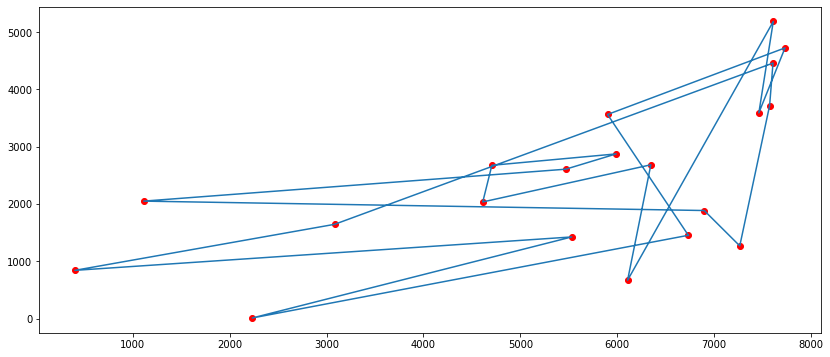

In [14]:
import time

#ant colony for each graph
start = time.process_time()
timeAlg = time.time()

#calculating if we can deliver all points in time according to traffic data
#open traffic file
file = open("./average_at_peek", "r")
contents = file.read()
traffic = ast.literal_eval(contents)
file.close()


shortest_path =[]
for index,graph in enumerate(graphes):
    tmp_path=[]
    if index == 0:
        reindex = huit
    elif index == 1:
        reindex = dix
    elif index == 2:
        reindex = douze
    elif index == 3:
        reindex = quatorze
    elif index == 4:
        reindex = seize
    elif index == 5:
        reindex = dixhuit
    print("Les point à livrer pour cette plage horaire sont : ", reindex)
    if len(graph)!=0 and len(graph) != 1 and len(graph)!=2:
        graphSize=len(graph)
        colonies = int(graphSize/2)
        ants = graphSize

        #pheromones init
        pheromones = np.ones((graphSize,graphSize))
        distanceproba = 1 / (np.eye(graphSize) + graph) - np.eye(graphSize)
        #colonies
        for i in range(colonies):
            antPath = np.zeros((graphSize, graphSize)).astype(int) - 1   # Ant's path
            startPoint = [i for i in range(graphSize)]
            rd.shuffle(startPoint)
            unvisited = []
            probability = []
            probAccum = 0
            for i in range(len(antPath)):
                antPath[i][0] = startPoint[i]
            for i in range(len(antPath[0])-1):
                for j in range(len(antPath)):
                    for p in range(graphSize):
                        if p not in antPath[j]:
                            unvisited.append(p)
                    for point in unvisited:
                        probAccum += pheromones[antPath[j][i]][point] ** 1 * distanceproba[antPath[j][i]][point] **1
                    for n in unvisited:
                        p =(pheromones[antPath[j][i]][n] ** 1 * distanceproba[antPath[j][i]][n] ** 1 / probAccum) if probAccum != 0 else 0
                        probability.append(p)
                    roulette = np.array(probability).cumsum()
                    r = rd.uniform(min(roulette), max(roulette))
                    for x in range(len(roulette)):
                        if roulette[x] >= r:
                            antPath[j][i+1] = unvisited[x]
                            break
                    unvisited = []
                    probability = []
                    probAccum = 0         
            length = lengthCal(antPath,graph)
            for i in range(len(antPath)):
                for j in range(len(antPath[i]) - 1):
                    pheromones[antPath[i][j]][antPath[i][j + 1]] += 1 / length[i]
                pheromones[antPath[i][-1]][antPath[i][0]] += 1 / length[i]
        print("La distance est : ", min(length))
        print("Le chemin le plus court pour cette plage est  :")
        for i in antPath[length.index(min(length))]:
            tmp_path.append(reindex[i])
    elif len(graph)==2:
        print("Le chemin le plus court pour cette plage est  :")
        for i in range(len(graph)):
            tmp_path.append(reindex[i])
    elif graph == [[0]] and len(graph)!=0:
        print("Le chemin le plus court pour cette plage est  :")
        tmp_path.append(reindex[0])
    pp = list(set(tmp_path))
    tmp_path=pp.copy()
    print(tmp_path)
    shortest_path.append(tmp_path)

    
    print("----------------------------------------------------------------------------------------")
stop = time.process_time()
print("Le parcours le plus optimal est :")
tmp=0
kk=[]
for x in shortest_path:
    kk.append(list(set(x)))
shortest_path=kk.copy()
print(shortest_path)
for x in shortest_path:
    if x:
        tmp+=len(x)
nbDel = tmp
print("----------------------------------------------------------------------------------------")
print("Le nombre de points à livrer est :",nbDel)

timeAlg = time.time() - timeAlg
print("time compute : " + str(timeAlg))


#affichageplot

def plotDrawBestRouteAnt(indexList) : #fonction d'affichage plot
    coord = [ ]
    xo = [ ]
    yo = [ ]
    
    for i in indexList :
        xo.append(cityList[i].x)
        yo.append(cityList[i].y)
    print(cityList[indexList[0]].x)
    print(cityList[indexList[0]].y)
    xo.append(cityList[indexList[0]].x) #graphe hamiltonien donc pour retourner au début (premiere ville)
    yo.append(cityList[indexList[0]].y)
    coord = [xo, yo]
    return coord

fig = plt.figure(figsize=(14, 6))


for city in cityList :
    plt.plot(city.x, city.y, 'ro')


i = 0
for path in shortest_path :
    if len(path) != 0 :
        bestRouteCoord = plotDrawBestRouteAnt(path)  #fonction d'affichage plot
        plt.plot(bestRouteCoord[0], bestRouteCoord[1])
        i = i + 1
    
    

plt.show()

    
    






<h2>Etape n°4: La pause</h2>
<br>
Les méta-heuristque se comportent comme des algorithmes de recherche, tentant d’apprendre les caractéristiques d’un problème afin d’en trouver une approximation de la meilleure solution. Mais si on est limité par le temps, l'algorithme doit être capable de renvoyer la meilleure solution qu'il a trouvé : celle qui tend le plus vers un optimum global.<br>
Si on pause la cellule du dessus, l'algorithme arrête d'itérer. Après ça, il nous renvoit le meilleur chemin qu'il ait pu trouver durant sont temps de calcul en respectant les contraintes imposées.

In [ ]:

#identify empty delivery times
separation = 0
for index, x in enumerate((huit,dix,douze,quatorze,seize, dixhuit)):
    if x:
        if index < 3:
            separation+=1

#for each delivery time, check if the route isnt more than 2 hours 
final_path=[0]
deliveries_left = []
for index, path in enumerate(shortest_path):
    time=0
    if(len(graph)!=0):
        for i,point in enumerate(path):
            if (time > 7200.0):
                deliveries_left.append(point)
            elif time<7200.0:
                if i < len(path)-1:
                    dist= basegraph[path[i]][path[i+1]]
                    if index <= separation:
                        time+=dist*traffic[0]['speed']/3.6
                    elif index > separation:
                        time+=dist*traffic[1]['speed']/3.6
                    final_path.append(point)

                
print("Le chemin final en respectant les plages horaires en focntion du traffic est : ")
print(final_path)
print("----------------------------------------------------------------------------------------")
print("les points qui n'ont pas pu etre livrés sont : ", deliveries_left)
